### Will a Customer Accept the Coupon?

**Context**

Imagine driving through town and a coupon is delivered to your cell phone for a restaraunt near where you are driving. Would you accept that coupon and take a short detour to the restaraunt? Would you accept the coupon but use it on a sunbsequent trip? Would you ignore the coupon entirely? What if the coupon was for a bar instead of a restaraunt? What about a coffee house? Would you accept a bar coupon with a minor passenger in the car? What about if it was just you and your partner in the car? Would weather impact the rate of acceptance? What about the time of day?

Obviously, proximity to the business is a factor on whether the coupon is delivered to the driver or not, but what are the factors that determine whether a driver accepts the coupon once it is delivered to them? How would you determine whether a driver is likely to accept a coupon?

**Overview**

The goal of this project is to use what you know about visualizations and probability distributions to distinguish between customers who accepted a driving coupon versus those that did not.

**Data**

This data comes to us from the UCI Machine Learning repository and was collected via a survey on Amazon Mechanical Turk. The survey describes different driving scenarios including the destination, current time, weather, passenger, etc., and then ask the person whether he will accept the coupon if he is the driver. Answers that the user will drive there ‘right away’ or ‘later before the coupon expires’ are labeled as ‘Y = 1’ and answers ‘no, I do not want the coupon’ are labeled as ‘Y = 0’.  There are five different types of coupons -- less expensive restaurants (under \\$20), coffee houses, carry out & take away, bar, and more expensive restaurants (\\$20 - \\$50). 

**Deliverables**

Your final product should be a brief report that highlights the differences between customers who did and did not accept the coupons.  To explore the data you will utilize your knowledge of plotting, statistical summaries, and visualization using Python. You will publish your findings in a public facing github repository as your first portfolio piece. 





### Data Description
Keep in mind that these values mentioned below are average values.

The attributes of this data set include:
1. User attributes
    -  Gender: male, female
    -  Age: below 21, 21 to 25, 26 to 30, etc.
    -  Marital Status: single, married partner, unmarried partner, or widowed
    -  Number of children: 0, 1, or more than 1
    -  Education: high school, bachelors degree, associates degree, or graduate degree
    -  Occupation: architecture & engineering, business & financial, etc.
    -  Annual income: less than \\$12500, \\$12500 - \\$24999, \\$25000 - \\$37499, etc.
    -  Number of times that he/she goes to a bar: 0, less than 1, 1 to 3, 4 to 8 or greater than 8
    -  Number of times that he/she buys takeaway food: 0, less than 1, 1 to 3, 4 to 8 or greater
    than 8
    -  Number of times that he/she goes to a coffee house: 0, less than 1, 1 to 3, 4 to 8 or
    greater than 8
    -  Number of times that he/she eats at a restaurant with average expense less than \\$20 per
    person: 0, less than 1, 1 to 3, 4 to 8 or greater than 8
    -  Number of times that he/she goes to a bar: 0, less than 1, 1 to 3, 4 to 8 or greater than 8
    

2. Contextual attributes
    - Driving destination: home, work, or no urgent destination
    - Location of user, coupon and destination: we provide a map to show the geographical
    location of the user, destination, and the venue, and we mark the distance between each
    two places with time of driving. The user can see whether the venue is in the same
    direction as the destination.
    - Weather: sunny, rainy, or snowy
    - Temperature: 30F, 55F, or 80F
    - Time: 10AM, 2PM, or 6PM
    - Passenger: alone, partner, kid(s), or friend(s)


3. Coupon attributes
    - time before it expires: 2 hours or one day

In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import plotly.express as px

## Define shared functions

In [2]:
#get coupon acceptance rate by dividing acceptance count by total count
def get_coupon_accept_rate(df, raw=False):
    rate = df[df['Y'] == 1].shape[0] / df.shape[0]
    if raw:
        return rate
    return str(round(rate*100, 1)) + '%'

#visualize value counts of column, colored by coupon acceptance
#visualize coupon acceptance rates of all values in column
def investigate_df_column(df, column):
    #group dataframe by column and 'Y'
    df = df.groupby([column, 'Y']).size().unstack()
    #reverse order of columns
    df = df[[1, 0]]
    #sort by coupon count
    sorted_indices = (df[0] + df[1]).sort_values(ascending=False).index
    df = df.loc[sorted_indices, :]
    
    #plot dataframe
    fig = px.bar(df)
    fig.update_layout(
        title = 'Count of \'' + column + '\' values, colored by acceptance',
        legend_title='Drivers',
    )
    legend_values = {'0':'Not Accepted', '1': 'Accepted'}
    fig.for_each_trace(lambda t: t.update(name = legend_values[t.name]))
    fig.show()
    
    #plot accept rates
    accept_rates = df[1] / (df[0]+df[1])
    accept_rates = accept_rates.sort_values()
    fig = px.bar(accept_rates, title='Accept rate of \'' + column + '\' values')
    fig.layout.yaxis.tickformat = ',.1%'
    fig.update_layout(showlegend=False)
    fig.show()

def investigate_df_condition_to_other(df, condition, condition_name, comment=None):
    #get drivers that meet the conditions
    df_condition = df[condition]
    
    #get the other drivers
    df_other= df[~df.index.isin(df_condition.index)]
    
    #print results
    print('Drivers who met the conditions: ' + get_coupon_accept_rate(df_condition))
    print('Other drivers: ' + get_coupon_accept_rate(df_other))
    
    #create dataframe with accept rates for visualization
    df1 = pd.DataFrame({
        'Drivers': [condition_name, 'other'],
        'Accept Rate': [get_coupon_accept_rate(df_condition, raw=True), get_coupon_accept_rate(df_other, raw=True)]
    })
    
    #visualize acceptance
    title = 'Coupon accept rate between groups of drivers'
    fig = px.bar(df1, x='Drivers', y='Accept Rate', title=title)
    fig.layout.yaxis.tickformat = ',.1%'
    fig.show()

def investigate_accept_rate(df, title):
    #print results
    print(title + ': ' + get_coupon_accept_rate(df))

    #create coupon accept rate series for visualization
    s = df['Y'].value_counts()
    #divide by total count to get rate
    s = s.divide(s.sum())
    #order by accept first
    s = s.sort_index(ascending=False)
    
    #rename values for plotting
    s = s.rename_axis('Drivers')
    s = s.rename({0: 'Not Accepted', 1: 'Accepted'})
    df1 = s.reset_index(name='Rate')
    
    #plot dataframe
    fig = px.pie(df1, names='Drivers', values='Rate', color='Drivers', title=title)
    fig.layout.yaxis.tickformat = ',.1%'
    fig.show()

### Problems

Use the prompts below to get started with your data analysis.  

1. Read in the `coupons.csv` file.




In [3]:
df = pd.read_csv('data/coupons.csv')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12684 entries, 0 to 12683
Data columns (total 26 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   destination           12684 non-null  object
 1   passanger             12684 non-null  object
 2   weather               12684 non-null  object
 3   temperature           12684 non-null  int64 
 4   time                  12684 non-null  object
 5   coupon                12684 non-null  object
 6   expiration            12684 non-null  object
 7   gender                12684 non-null  object
 8   age                   12684 non-null  object
 9   maritalStatus         12684 non-null  object
 10  has_children          12684 non-null  int64 
 11  education             12684 non-null  object
 12  occupation            12684 non-null  object
 13  income                12684 non-null  object
 14  car                   108 non-null    object
 15  Bar                   12577 non-null

2. Investigate the dataset for missing or problematic data.

car
Found 12576 nan values
Unique values: [nan 'Scooter and motorcycle' 'crossover' 'Mazda5' 'do not drive'
 'Car that is too old to install Onstar :D']

Bar
Found 107 nan values
Unique values: ['never' 'less1' '1~3' 'gt8' nan '4~8']

CoffeeHouse
Found 217 nan values
Unique values: ['never' 'less1' '4~8' '1~3' 'gt8' nan]

CarryAway
Found 151 nan values
Unique values: [nan '4~8' '1~3' 'gt8' 'less1' 'never']

RestaurantLessThan20
Found 130 nan values
Unique values: ['4~8' '1~3' 'less1' 'gt8' nan 'never']

Restaurant20To50
Found 189 nan values
Unique values: ['1~3' 'less1' 'never' 'gt8' '4~8' nan]



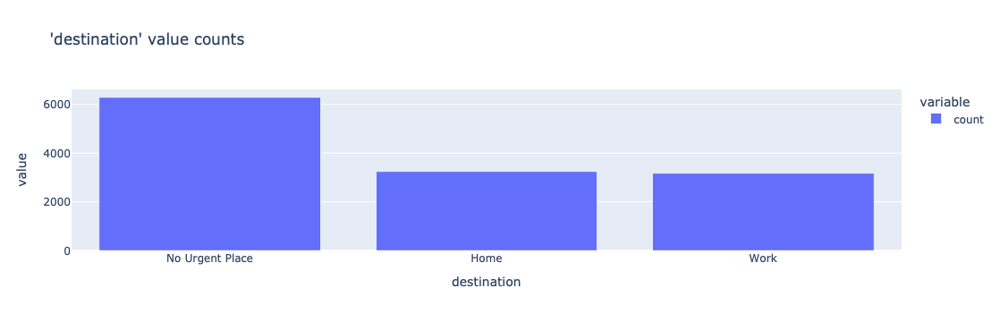

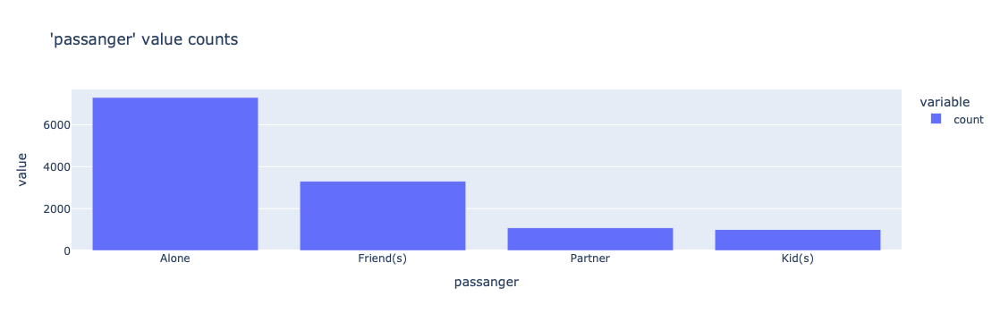

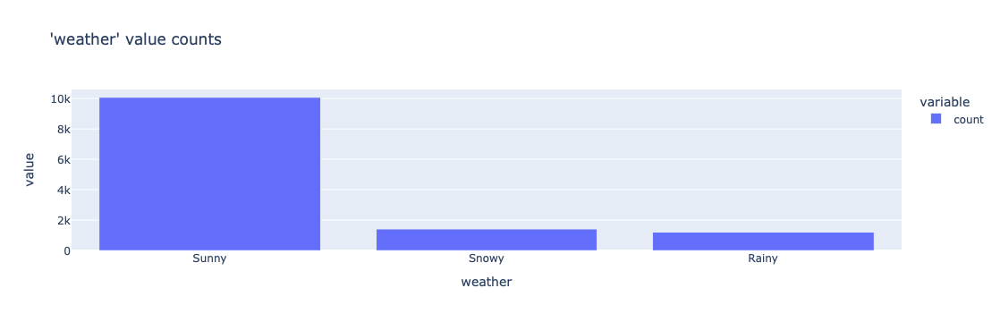

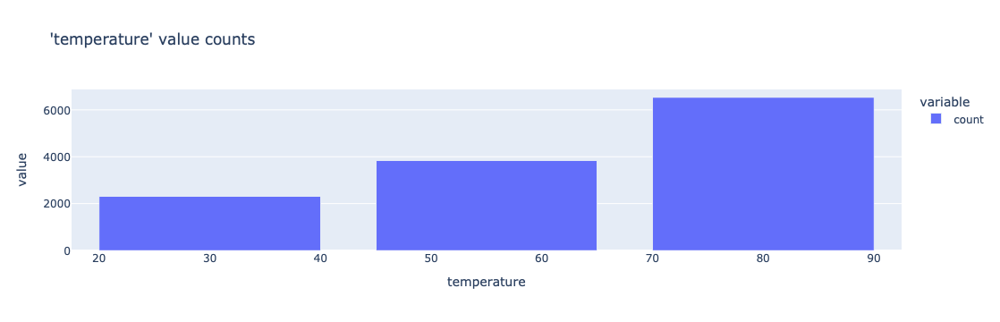

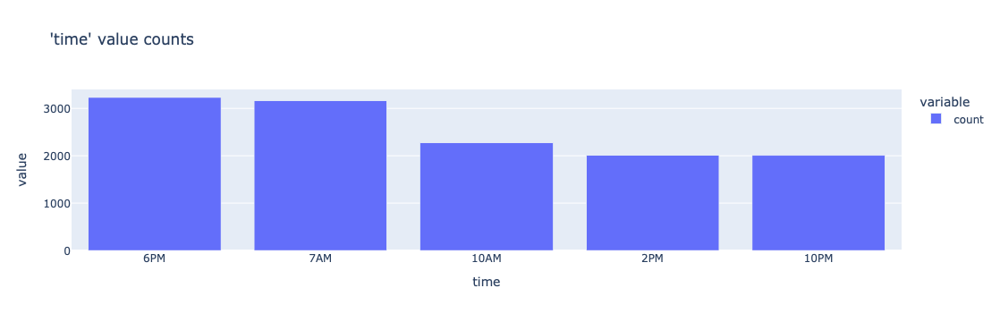

...

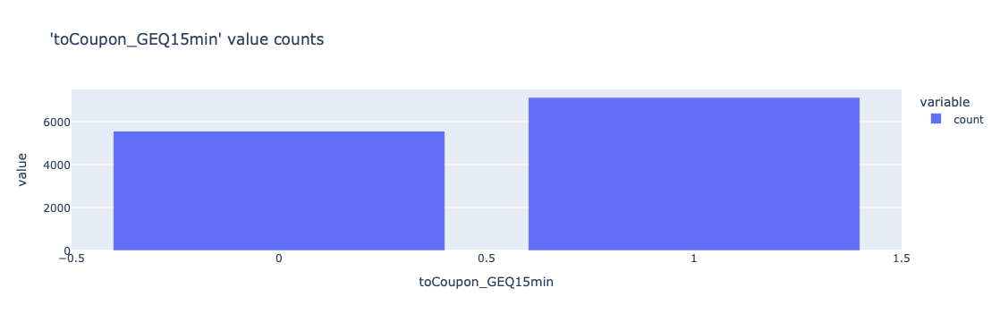

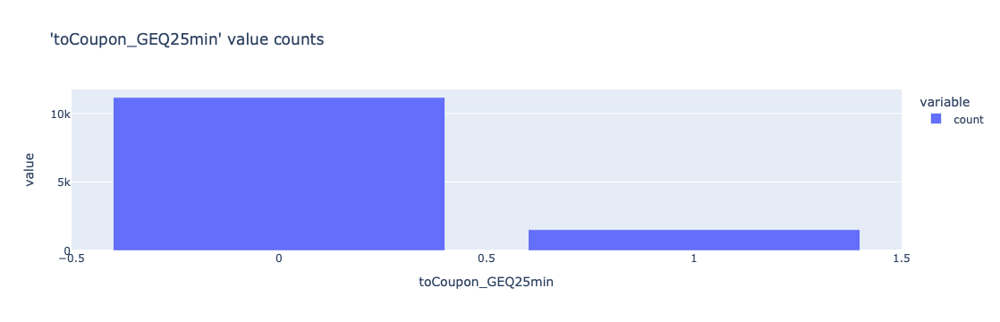

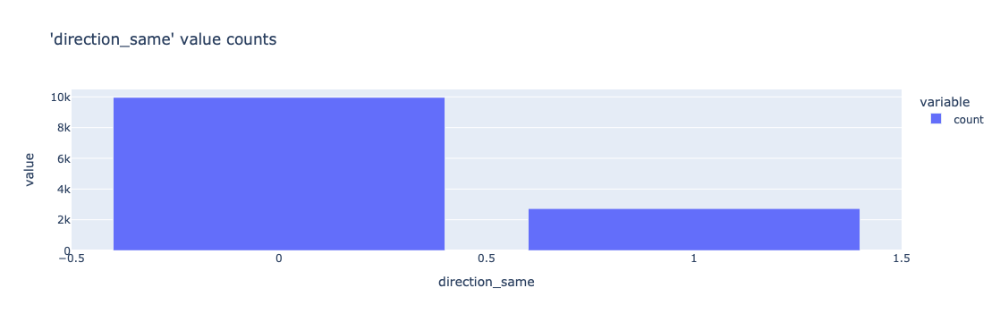

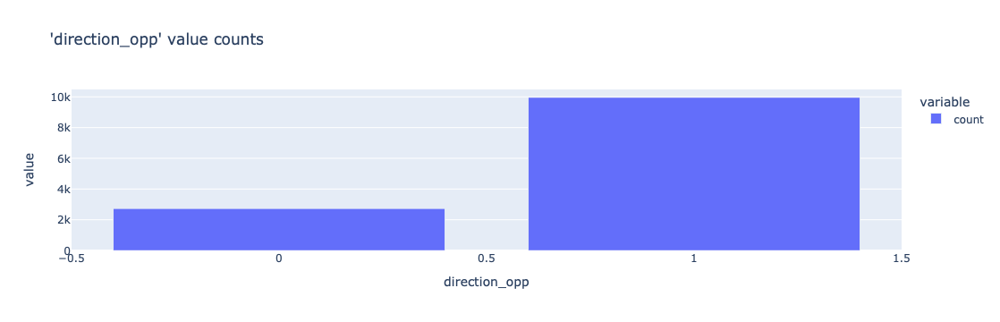

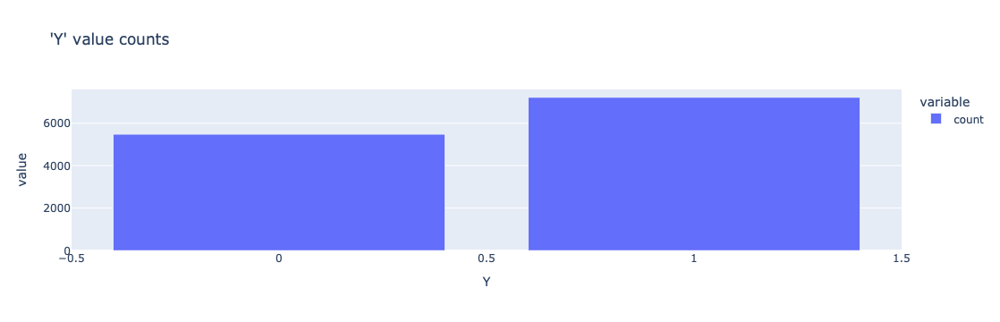

In [5]:
#check each column for missing data
#if found, print column name, numnber of nan values, and all possible values for reference
for series_name, series in df.items():
    count = series.isna().sum();
    if count > 0:
        print(series_name)
        print('Found ' + str(count) + ' nan values')
        print('Unique values: ' + str(series.unique()))
        print()

#plot value counts of each column to examine dataframe
for series_name, series in df.items():
    title = '\'' + series_name + '\' value counts'
    fig = px.bar(series.value_counts(), title=title)
    fig.show()

3. Decide what to do about your missing data -- drop, replace, other...

In an effort to use as much data as possible for each analysis, I will not be dropping any missing data ahead of time. Instead, I will be dropping missing data on an as-needed basis.

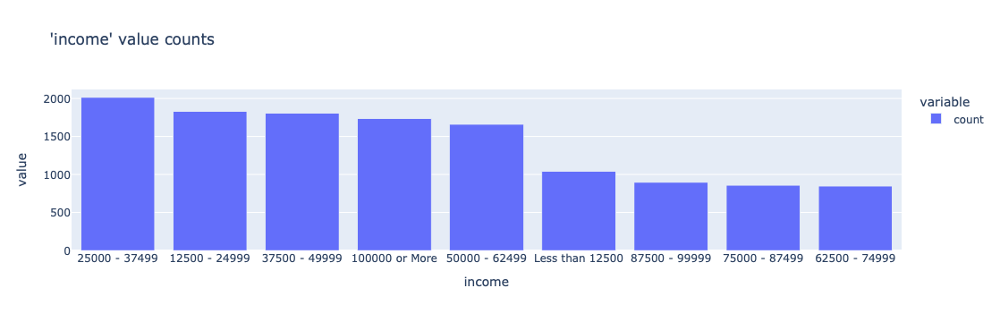

In [6]:
#make a copy of dataframe to make edits on
df_clean = df

#we see above that there is an error generating the plot for 'income' column value counts
#after some trial and error, I found the solution is to remove the dollar sign from all values
df_clean['income'] = df_clean['income'].str.replace('$', '', regex=False)
fig = px.bar(df_clean['income'].value_counts(), title='\'income\' value counts')
fig.show()

4. What proportion of the total observations chose to accept the coupon?

Accept rate of all coupons: 56.8%


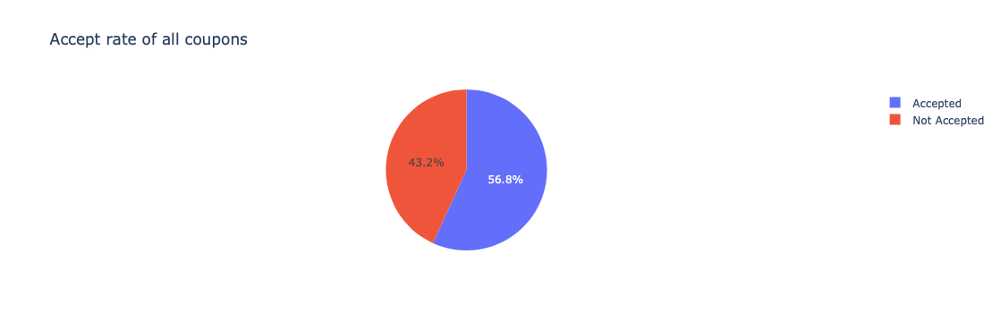

In [7]:
investigate_accept_rate(df_clean, 'Accept rate of all coupons')

5. Use a bar plot to visualize the `coupon` column.

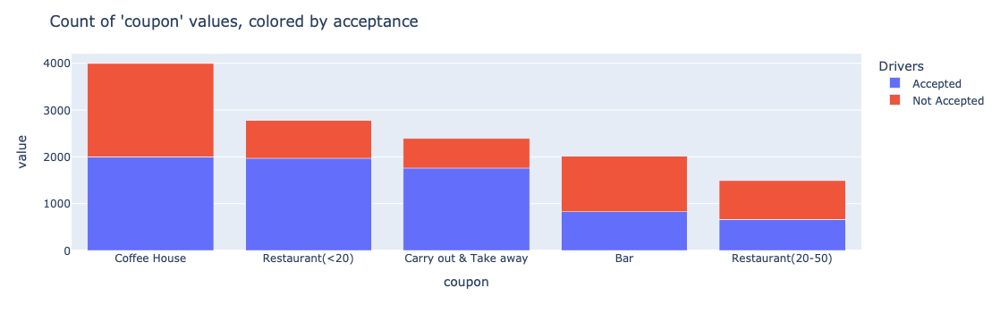

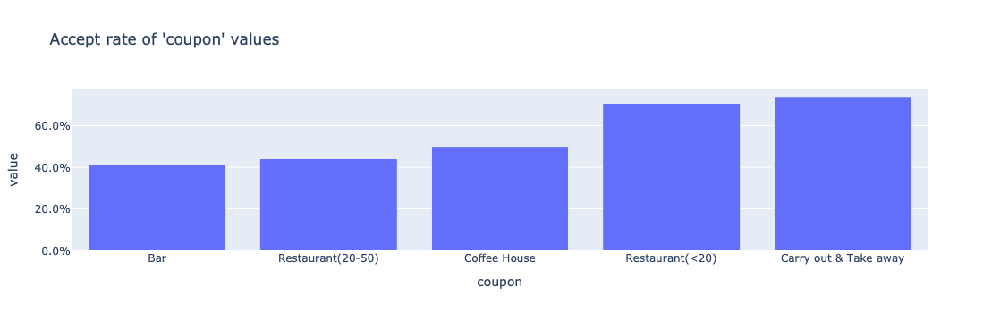

In [8]:
investigate_df_column(df_clean, 'coupon')

6. Use a histogram to visualize the temperature column.

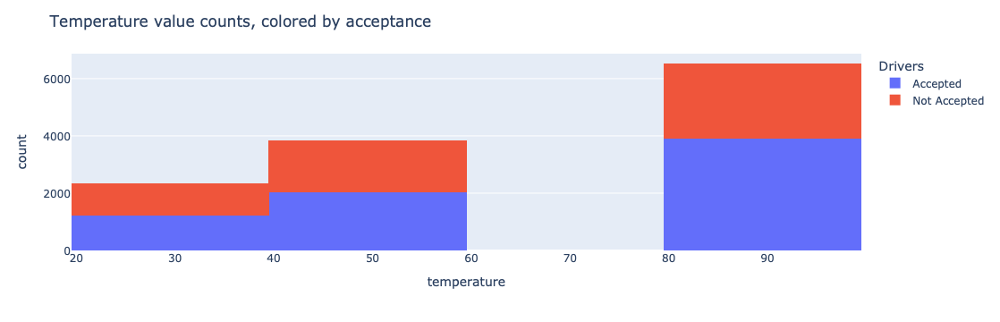

In [9]:
#plot temperature value counts
fig = px.histogram(df_clean, x='temperature', color='Y')
fig.update_layout(
    title = 'Temperature value counts, colored by acceptance',
    #xaxis_title='Coupon Type',
    #yaxis_title='Count',
    legend_title='Drivers',
)
legend_values = {'0':'Not Accepted', '1': 'Accepted'}
fig.for_each_trace(lambda t: t.update(name = legend_values[t.name]))
fig.show()

**Investigating the Bar Coupons**

Now, we will lead you through an exploration of just the bar related coupons.  

1. Create a new `DataFrame` that contains just the bar coupons.


In [10]:
df_bar = df_clean[df_clean['coupon'] == 'Bar']

2. What proportion of bar coupons were accepted?

Accept rate of bar coupons: 41.0%


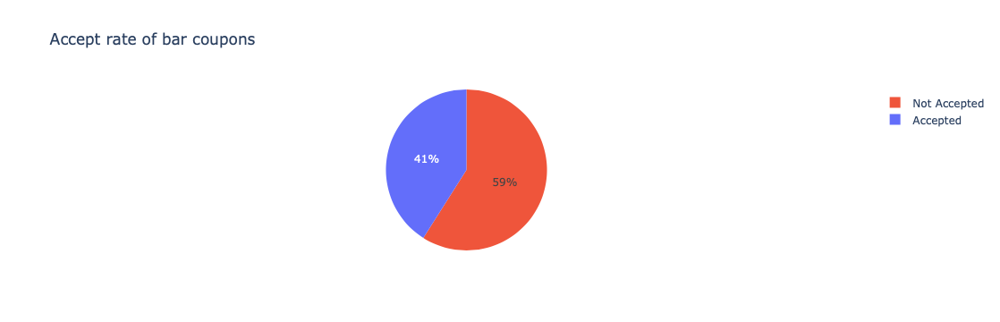

In [11]:
investigate_accept_rate(df_bar, 'Accept rate of bar coupons')

3. Compare the acceptance rate between those who went to a bar 3 or fewer times a month to those who went more.


In [12]:
#check required columns for null values to determine if they need to removed
print(df_bar['Bar'].isna().sum())

21


We need to exclude rows where the Bar column is null as we are uncertain of what null represents and don't want it to skew the result. For example, null could mean 'never', or it could mean 'no answer'.

Drivers who met the conditions: 37.1%
Other drivers: 76.9%


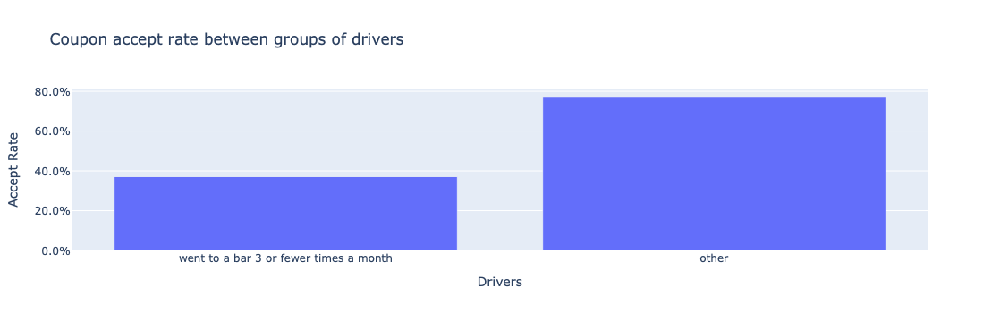

In [13]:
#remove rows where 'Bar' is null
df_bar_filtered = df_bar[df_bar['Bar'].notna()]

#condition for drivers who went to a bar 3 or fewer times a month
condition = df_bar_filtered['Bar'].isin(['never', 'less1', '1~3'])

#compare drivers who met the condition to others
investigate_df_condition_to_other(df_bar_filtered, condition, 'went to a bar 3 or fewer times a month')

4. Compare the acceptance rate between drivers who go to a bar more than once a month and are over the age of 25 to the all others.  Is there a difference?


In [14]:
#check required columns for null values to determine if they need to removed
print(df_bar['Bar'].isna().sum())
print(df_bar['age'].isna().sum())

21
0


Drivers who met the conditions: 69.5%
Other drivers: 33.4%


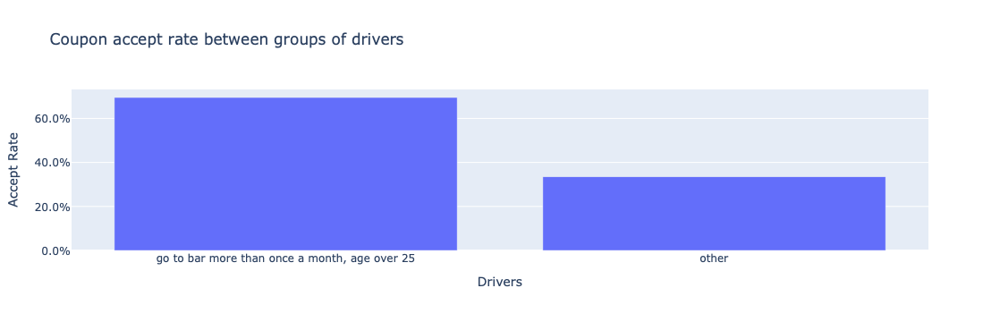

In [15]:
#remove rows where 'Bar' is null
df_bar_filtered = df_bar[df_bar['Bar'].notna()]

#condition for drivers who go to a bar at least once a month
condition1 = df_bar_filtered['Bar'].isin(['1~3', '4~8', 'gt8'])

#condition for drivers over the age of 25
condition2 = ~df_bar_filtered['age'].isin(['21', 'below21'])

#combine conditions with AND
condition = condition1 & condition2

#compare drivers who met the condition to others
investigate_df_condition_to_other(df_bar_filtered, condition, 'go to bar more than once a month, age over 25')

5. Use the same process to compare the acceptance rate between drivers who go to bars more than once a month and had passengers that were not a kid and had occupations other than farming, fishing, or forestry. 


In [16]:
#check required columns for null values to determine if they need to removed
print(df_bar['Bar'].isna().sum())
print(df_bar['passanger'].isna().sum())
print(df_bar['occupation'].isna().sum())

21
0
0


Drivers who met the conditions: 70.6%
Other drivers: 38.3%


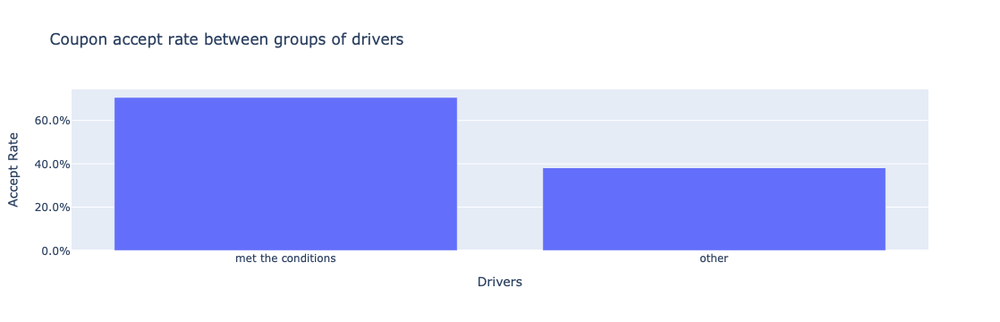

In [17]:
#remove rows where 'Bar' is null
df_bar_filtered = df_bar[df_bar['Bar'].notna()]

#condition for drivers who go to a bar at least once a month
condition1 = df_bar_filtered['Bar'].isin(['1~3', '4~8', 'gt8'])

#condition for having passengers that were not a kid
condition2 = df_bar_filtered['passanger'].isin(['Friend(s)', 'Partner'])

#condtion for having an occupation other than farming, fishing, or forestry
condition3 = ~df_bar_filtered['occupation'].isin(['Farming Fishing & Forestry', 'Unemployed'])

#combine conditions with AND
condition = condition1 & condition2 & condition3

#compare drivers who met the condition to others
investigate_df_condition_to_other(df_bar_filtered, condition, 'met the conditions')

We can see that drivers who go to a bar at least once a month, had passangers that were not a kid, and had occupations other than farming, fishing, or forestry had a bar coupon accept rate of 71%, and those that didn't fit that criteria had an accept rate of 38%

6. Compare the acceptance rates between those drivers who:

- go to bars more than once a month, had passengers that were not a kid, and were not widowed *OR*
- go to bars more than once a month and are under the age of 30 *OR*
- go to cheap restaurants more than 4 times a month and income is less than 50K. 



In [18]:
print(df_bar['maritalStatus'].unique())
print(df_bar['age'].unique())
print(df_bar['RestaurantLessThan20'].unique())
print(df_bar['income'].unique())

['Unmarried partner' 'Single' 'Married partner' 'Divorced' 'Widowed']
['21' '46' '26' '31' '41' '50plus' '36' 'below21']
['4~8' '1~3' 'less1' 'gt8' nan 'never']
['37500 - 49999' '62500 - 74999' '12500 - 24999' '75000 - 87499'
 '50000 - 62499' '25000 - 37499' '100000 or More' '87500 - 99999'
 'Less than 12500']


Drivers who met the conditions: 63.1%
Other drivers: 32.6%


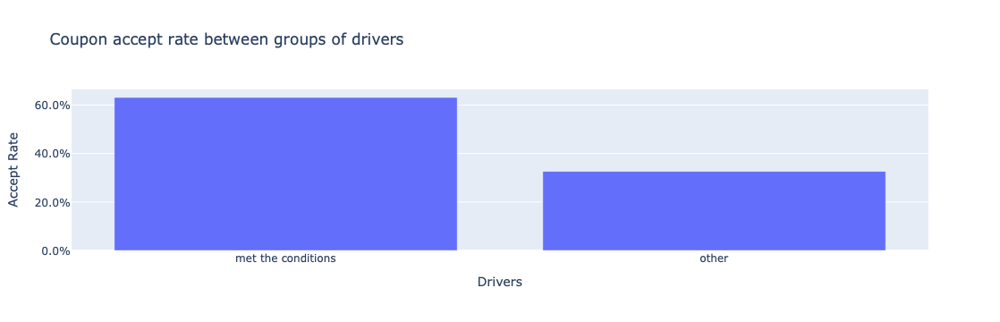

In [19]:
#remove rows where 'Bar' and 'RestaurantLessThan20' is null
df_bar_filtered = df_bar[df_bar['Bar'].notna() & df_bar['RestaurantLessThan20'].notna()]

#condition for drivers who go to bars more than once a month, had passengers that were not a kid, and were not widowed
condition1a = df_bar_filtered['Bar'].isin(['1~3', '4~8', 'gt8'])
condition1b = df_bar_filtered['passanger'].isin(['Friend(s)', 'Partner'])
condition1c = df_bar_filtered['maritalStatus'] != 'Widowed'
condition1 = condition1a & condition1b & condition1c

#condition for drivers who go to bars more than once a month and are under the age of 30
condition2a = df_bar_filtered['Bar'].isin(['1~3', '4~8', 'gt8'])
condition2b = df_bar_filtered['age'].isin(['21', '26', 'below21'])
condition2 = condition2a & condition2b

#condition for drivers who go to cheap restaurants more than 4 times a month and income is less than 50K
condition3a = df_bar_filtered['RestaurantLessThan20'].isin(['4~8', 'gt8'])
condition3b = df_bar_filtered['income'].isin(['Less than 12500', '12500 - 24999'])
condition3 = condition3a & condition3b

#combine conditions with OR
condition = condition1 | condition2 | condition3

#compare drivers who met the condition to others
investigate_df_condition_to_other(df_bar_filtered, condition, 'met the conditions')

7.  Based on these observations, what do you hypothesize about drivers who accepted the bar coupons?

### Results of bar coupons investigation:

* The general acceptance rate of bar coupons is 41%.
* Drivers who go to bars 3 times or less a month are half as likely to accept vs others. (37% vs 77% acceptance rate).
* Drivers go to a bar at least once a month and are over the age of 25 are more than twice as likely to accept vs others. (70% vs 33% accept rate).
* Drivers who go to a bar at least once a month, had passangers that were not a kid, and had occupations other than farming, fishing, or forestry are more likely to accept vs others. (71% vs 38% accept rate).
* Drivers who:
    - go to bars more than once a month, had passengers that were not a kid, and were not widowed OR
    - go to bars more than once a month and are under the age of 30 OR
    - go to cheap restaurants more than 4 times a month and income is less than 50K.

  <br>are twice as likely to accept vs others. (63% vs 33% accept rate).

### Hypothesis:
People are very likely to accept the bar coupon if they go to bars very frequently. They are still likely to accept if they go less frequently but are older than 25.

### Independent Investigation

Using the bar coupon example as motivation, you are to explore one of the other coupon groups and try to determine the characteristics of passengers who accept the coupons.  

### Investigating the Carry out & Take away Coupons

In [20]:
df_togo = df_clean[df_clean['coupon'] == 'Carry out & Take away']

#### Check accept rate of all Carry out & Take away Coupons

Accept rate of all carry out & take away coupons: 73.5%


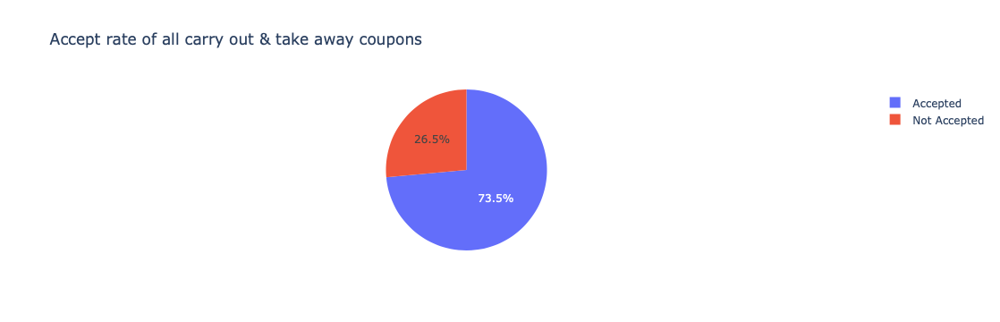

In [21]:
investigate_accept_rate(df_togo, 'Accept rate of all carry out & take away coupons')

### First, investigate all columns
Below I will check the value counts of all columns, colored by acceptance, followed by the accept rates for those values. This will help to gain some insight into making some conditional comparisons.

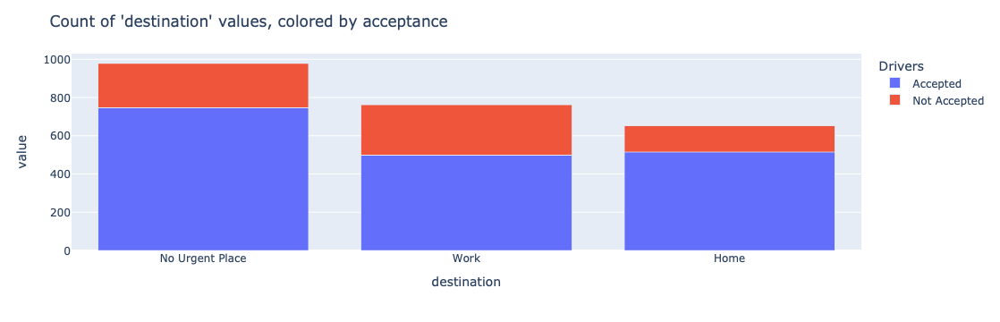

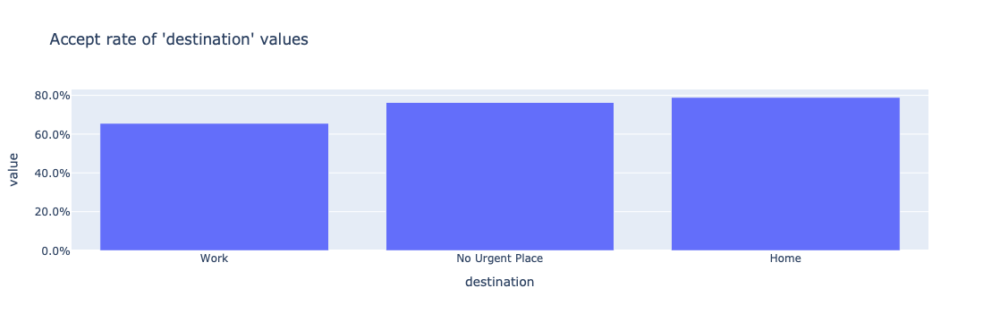

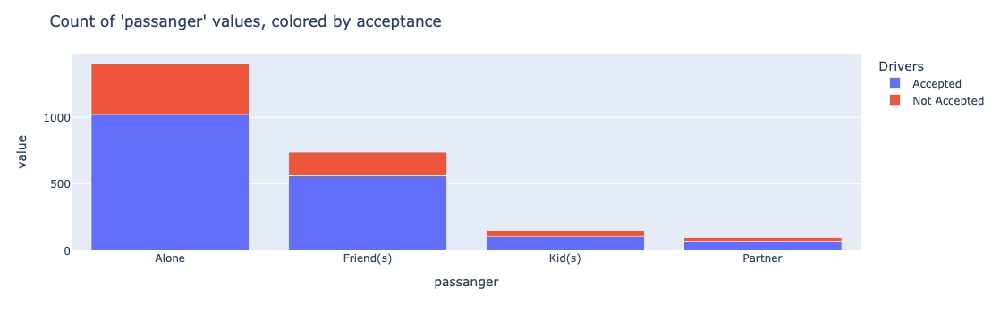

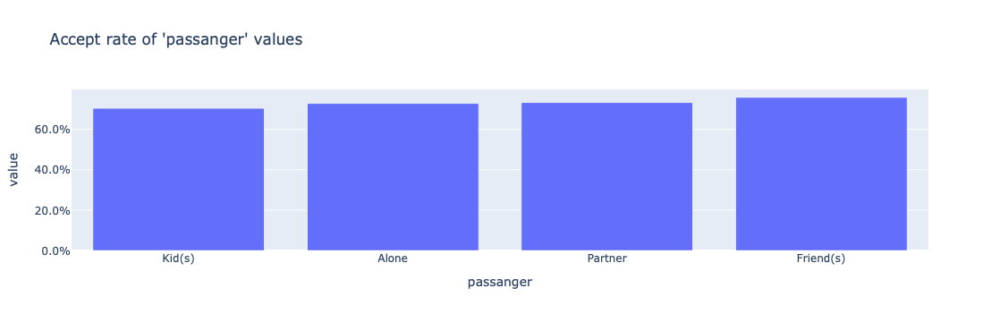

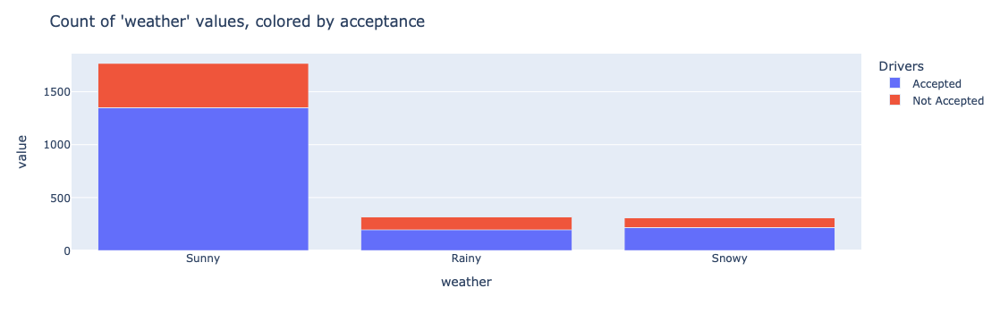

...

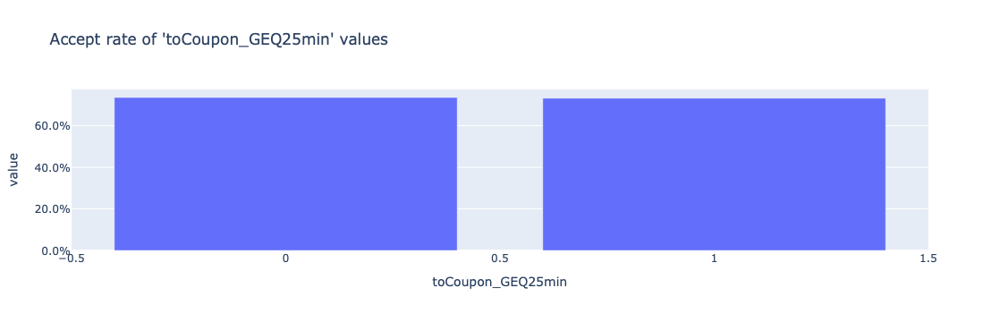

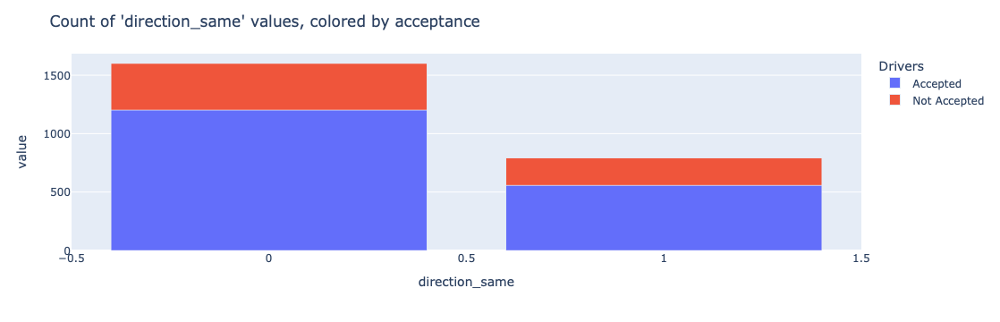

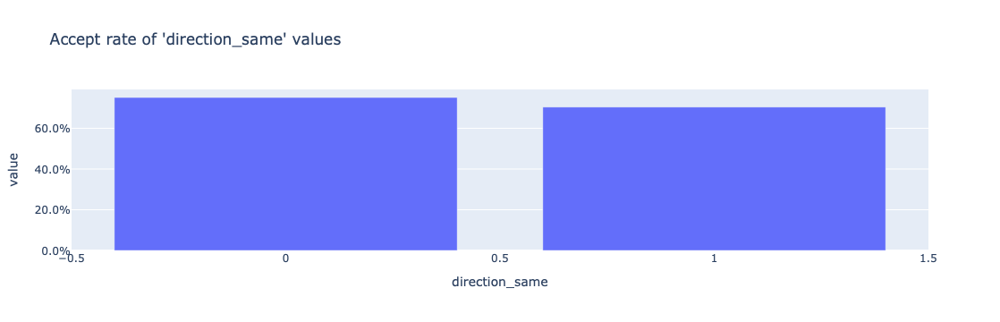

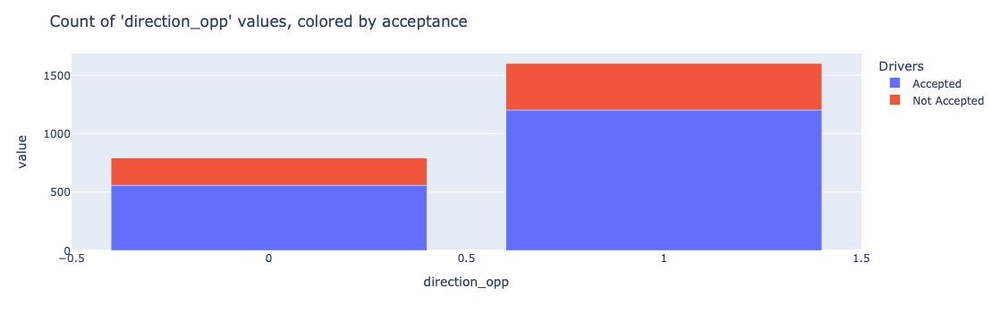

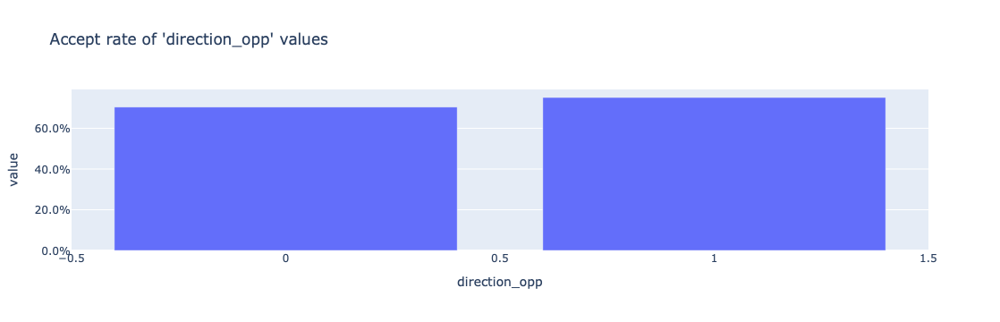

In [22]:
#get column names
column_names = list(df_togo.columns)

#remove coupon type and coupon accept columns
column_names.remove('coupon')
column_names.remove('Y')

for column_name in column_names:
    investigate_df_column(df_togo, column_name)

### Compare drivers going to work to others

In [23]:
df_togo['destination'].unique()

array(['No Urgent Place', 'Work', 'Home'], dtype=object)

Drivers who met the conditions: 65.5%
Other drivers: 77.3%


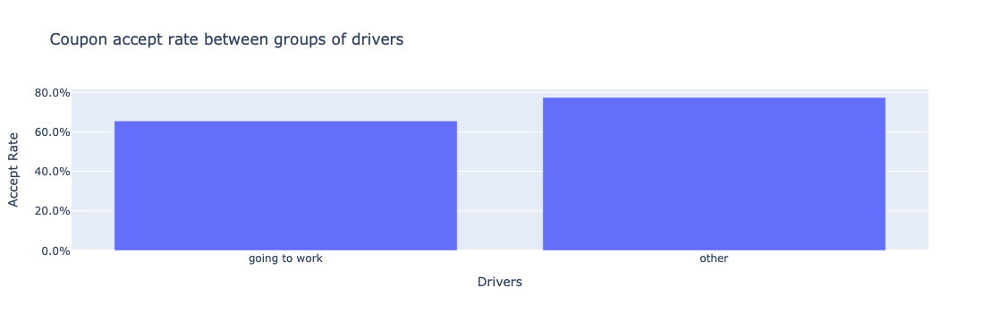

In [24]:
#condition for drivers who are going to work
condition = df_togo['destination'] == 'Work'

#compare drivers who met the condition to others
investigate_df_condition_to_other(df_togo, condition, 'going to work')

### Compare drivers driving at 10am or earlier to others

In [25]:
df_togo['time'].unique()

array(['10AM', '2PM', '7AM', '10PM', '6PM'], dtype=object)

Drivers who met the conditions: 67.4%
Other drivers: 80.6%


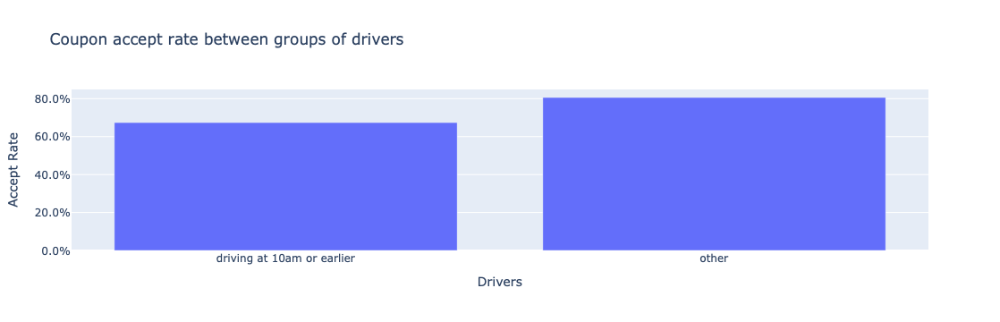

In [26]:
#condition for time 10am or earlier
condition = df_togo['time'].isin(['7AM', '10AM'])

#compare drivers who met the condition to others
investigate_df_condition_to_other(df_togo, condition, 'driving at 10am or earlier')

### Compare drivers having 'Life Physical Social Science' or 'Legal' occupation to others

In [27]:
df_togo['occupation'].unique()

array(['Unemployed', 'Architecture & Engineering', 'Student',
       'Education&Training&Library', 'Healthcare Support',
       'Healthcare Practitioners & Technical', 'Sales & Related',
       'Management', 'Arts Design Entertainment Sports & Media',
       'Computer & Mathematical', 'Life Physical Social Science',
       'Personal Care & Service', 'Community & Social Services',
       'Office & Administrative Support', 'Construction & Extraction',
       'Legal', 'Retired', 'Installation Maintenance & Repair',
       'Transportation & Material Moving', 'Business & Financial',
       'Protective Service', 'Food Preparation & Serving Related',
       'Production Occupations',
       'Building & Grounds Cleaning & Maintenance',
       'Farming Fishing & Forestry'], dtype=object)

Drivers who met the conditions: 50.0%
Other drivers: 73.8%


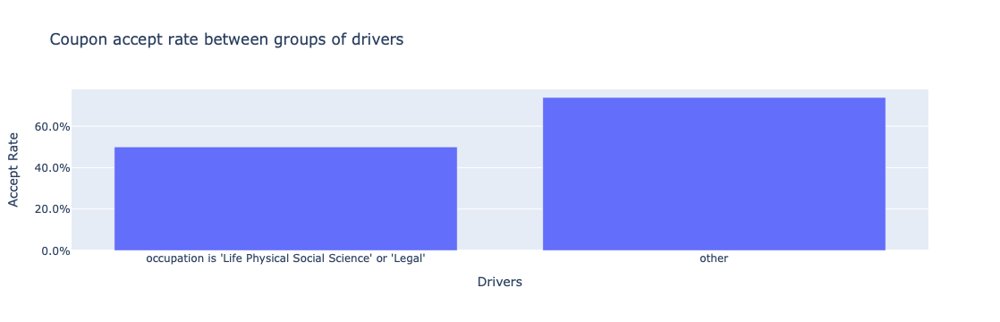

In [28]:
#condition for having 'Life Physical Social Science' or 'Legal' occupation
condition = df_togo['occupation'].isin(['Life Physical Social Science', 'Life Physical Social Science'])

#compare drivers who met the condition to others
investigate_df_condition_to_other(df_togo, condition, 'occupation is \'Life Physical Social Science\' or \'Legal\'')

### Compare drivers who go to bars more than 8 times a month to others

In [29]:
df_togo['Bar'].unique()

array(['never', 'less1', '1~3', 'gt8', '4~8', nan], dtype=object)

Drivers who met the conditions: 56.1%
Other drivers: 74.3%


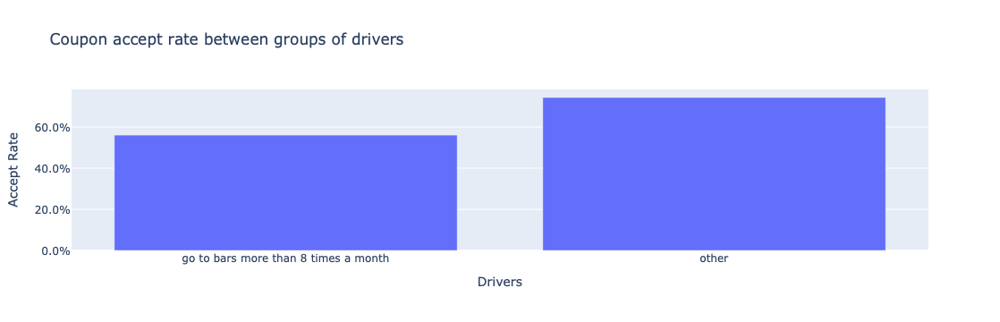

In [30]:
#remove rows where 'Bar' is null
df_togo_filtered = df_togo[df_togo['Bar'].notna()]

#condition for going to bars more than 8 times a month
condition = df_togo_filtered['Bar'] == 'gt8'

#compare drivers who met the condition to others
investigate_df_condition_to_other(df_togo_filtered, condition, 'go to bars more than 8 times a month')

### Results of Carry out & Take away coupons investigation:

* The general acceptance rate of Carry out & Take away coupons is 73.5%, which is pretty good.
* People who are driving to work are around 12% less likely to accept than others.
* Similarly, people who are driving at 10am or earlier are around 13% less likely to accept than others.
* People that have a 'Life Physical Social Science' or 'Legal' occupation are 24% less likely to accept than others.
* People who go to bars more than 8 times a month are 18% less likely to accept than others.

### Hypothesis:
People are more likely to accept the carry out & take away coupon if they are not driving to work or it's too the morning. People who go to bars very frequently are much less likely to accept, as they are busy going to bars. People with some occupations, such as 'Life Physical Social Science' or 'Legal', are very disinterested in the carry out & take away coupon.